<a href="https://colab.research.google.com/github/iampro3/Sort/blob/main/result_YOLOv8video_Utralytics_0411.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Object Tracking : 230411
- 참조 사이트
  + 재시도함 : 성공공 
  + video 부분만 추출해 봄

  + 참조 git 사이트 : https://github.com/niconielsen32/ObjectTracking.git
  + 연관 youtube : https://www.youtube.com/watch?v=IHbJcOex6dk
  + video 부분 ultralytics 와 비교해 볼 것.
  + ultralytics Predict / Streaming Source for loop : 하단에 링크함
    ++ https://docs.ultralytics.com/modes/predict/#streaming-source-for-loop 

## Get the requirements

In [5]:
!pip install tf-centernet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [6]:
!git clone https://github.com/niconielsen32/ObjectTracking.git
!pip install -r /content/ObjectTracking/requirements.txt

Cloning into 'ObjectTracking'...
remote: Enumerating objects: 43, done.
remote: Counting objects: 100% (43/43), done.
remote: Compressing objects: 100% (20/20), done.
remote: Total 43 (delta 1), reused 2 (delta 0), pack-reused 0
Unpacking objects: 100% (43/43), 10.84 MiB | 5.94 MiB/s, done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 kB 5.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.8/29.8 MB 39.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 68.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for filterpy: filename=filterpy-1.4.5-py3-none-any.whl size=110473 sha256=92e6e320057283de1317baa607a6fa5aee53efa85d948cf75300e8dbd9decd73
  Stored in directory: /root/.cache/pip/wheels/53/e6/de/a09ea01e923aaf88b9f8c7c44329e857b2

## Object Tracking with SORT

In [7]:
import sys
import os
from google.colab import files
import centernet

sys.path.append("/content/ObjectTracking")
from sort import Sort
from lib import VisTrack, show_video, create_video

import numpy as np
import PIL.Image
import cv2
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import shutil

## Upload the video you want to work with

In [8]:
!wget https://viratdata.org/video/VIRAT_S_010204_05_000856_000890.mp4 -O video.mp4
video_file = "video.mp4"
#show_video(video_file)

--2023-04-11 14:26:29--  https://viratdata.org/video/VIRAT_S_010204_05_000856_000890.mp4
Resolving viratdata.org (viratdata.org)... 185.199.108.153, 185.199.109.153, 185.199.110.153, ...
Connecting to viratdata.org (viratdata.org)|185.199.108.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5248590 (5.0M) [application/mp4]
Saving to: ‘video.mp4’

video.mp4           100%[===================>]   5.00M  --.-KB/s    in 0.02s   

2023-04-11 14:26:29 (216 MB/s) - ‘video.mp4’ saved [5248590/5248590]



In [10]:
vt = VisTrack()

# Default: num_classes=80
obj = centernet.ObjectDetection(num_classes=80)

# num_classes=80 and weights_path=None: Pre-trained COCO model will be loaded.
obj.load_weights(weights_path=None)
     

766861424/766861424 [==============================] - 8s 0us/step


## Example image

--2023-04-11 14:28:10--  https://images.squarespace-cdn.com/content/v1/57aa455937c581cbe1aba790/1478015230831-I9TWP5BJX54APXMNPJ7W/ke17ZwdGBToddI8pDm48kBZw6jF4_OvU-ddo_vwqGhp7gQa3H78H3Y0txjaiv_0fDoOvxcdMmMKkDsyUqMSsMWxHk725yiiHCCLfrh8O1z5QPOohDIaIeljMHgDF5CVlOqpeNLcJ80NK65_fV7S1Ub61YCrK70I7JIpWiI8ho4Yi1WvVNQtDE81xuRbL1MFKm0sD-Bab7E9MY8W31A7zMQ/image-asset.jpeg
Resolving images.squarespace-cdn.com (images.squarespace-cdn.com)... 151.101.0.238, 151.101.64.238, 151.101.128.238, ...
Connecting to images.squarespace-cdn.com (images.squarespace-cdn.com)|151.101.0.238|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 371299 (363K) [image/jpeg]
Saving to: ‘img.jpeg’

img.jpeg            100%[===================>] 362.60K  --.-KB/s    in 0.004s  

2023-04-11 14:28:10 (93.0 MB/s) - ‘img.jpeg’ saved [371299/371299]



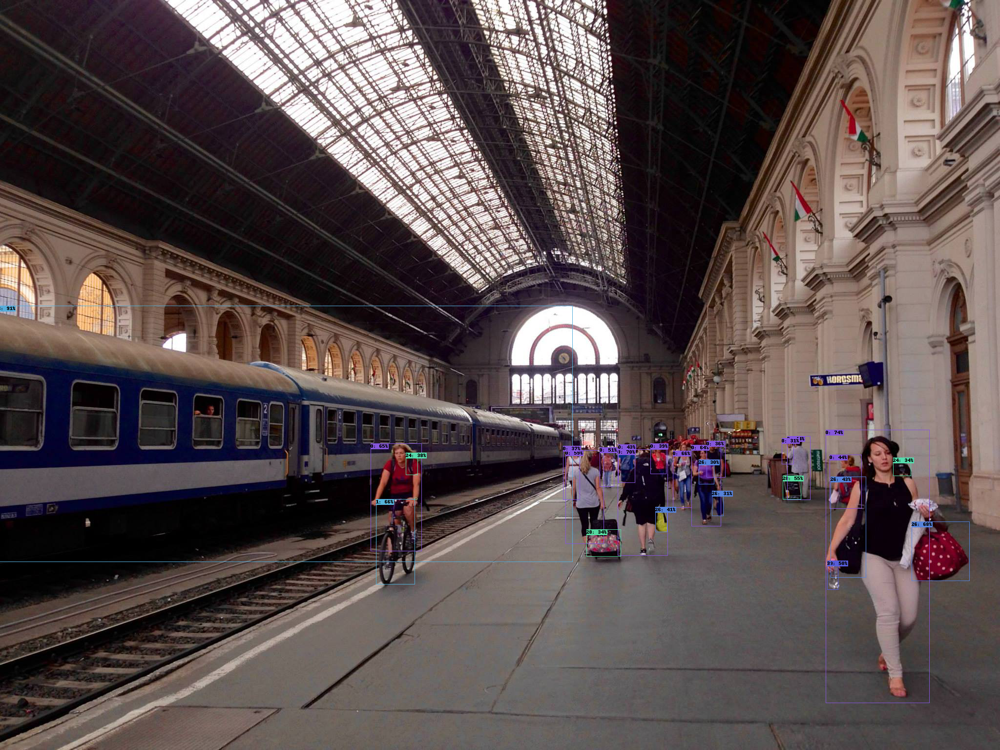

In [11]:
!wget https://images.squarespace-cdn.com/content/v1/57aa455937c581cbe1aba790/1478015230831-I9TWP5BJX54APXMNPJ7W/ke17ZwdGBToddI8pDm48kBZw6jF4_OvU-ddo_vwqGhp7gQa3H78H3Y0txjaiv_0fDoOvxcdMmMKkDsyUqMSsMWxHk725yiiHCCLfrh8O1z5QPOohDIaIeljMHgDF5CVlOqpeNLcJ80NK65_fV7S1Ub61YCrK70I7JIpWiI8ho4Yi1WvVNQtDE81xuRbL1MFKm0sD-Bab7E9MY8W31A7zMQ/image-asset.jpeg -O img.jpeg 

p_img = PIL.Image.open('img.jpeg')
img = cv2.cvtColor(np.array(p_img), cv2.COLOR_BGR2RGB)

boxes, classes, scores = obj.predict(img)

vt.draw_bounding_boxes(p_img, boxes, classes, scores)
     

## Predict on the video

In [12]:
vidcap = cv2.VideoCapture(video_file)
fps = vidcap.get(cv2.CAP_PROP_FPS)
length = int(vidcap.get(cv2.CAP_PROP_FRAME_COUNT))

folder_out = "Track"
if os.path.exists(folder_out):
    shutil.rmtree(folder_out)
os.makedirs(folder_out)

draw_imgs = []

sort = Sort(max_age=1, min_hits=3, iou_threshold=0.3)

pbar = tqdm(total=length)
i = 0
while True:
    ret, frame = vidcap.read()
    if not ret:
        break

    boxes, classes, scores = obj.predict(frame)
    detections_in_frame = len(boxes)
    if detections_in_frame:
        # centernet will do detection on all the COCO classes. "person" is class number 0 
        idxs = np.where(classes == 0)[0]
        boxes = boxes[idxs]
        scores = scores[idxs]
        classes = classes[idxs]
    else:
        boxes = np.empty((0, 5))

    dets = np.hstack((boxes, scores[:,np.newaxis]))
    res = sort.update(dets)

    boxes_track = res[:,:-1]
    boces_ids = res[:,-1].astype(int)

    p_frame = PIL.Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    if detections_in_frame:
        p_frame = vt.draw_bounding_boxes(p_frame, boxes_track, boces_ids, scores)
    p_frame.save(os.path.join(folder_out, f"{i:03d}.png"))

    i+=1
    pbar.update(1)

  0%|          | 0/584 [00:00<?, ?it/s]

## Show and download the tracking

In [13]:
track_video_file = 'tracking.mp4'
create_video(frames_patten='Track/%03d.png', video_file = track_video_file, framerate=fps)

In [14]:
files.download(track_video_file)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [15]:
show_video(track_video_file)

# 개인 스터디 : 230412 : 비디오 학습 및 생성 코드 비교
## ultralytics / predict / streaming - for loop 
- Here's a Python script using OpenCV (cv2) and YOLOv8 to run inference on video frames. This script assumes you have already installed the necessary packages (opencv-python and ultralytics).
- 사이트 링크 : https://docs.ultralytics.com/modes/predict/#streaming-source-for-loop

In [ ]:
# Ultralytics 사이트의 예시 : 비디오 
import cv2
from ultralytics import YOLO

# Load the YOLOv8 model
model = YOLO('yolov8n.pt')

# Open the video file
video_path = "path/to/your/video/file.mp4"
cap = cv2.VideoCapture(video_path)

# Loop through the video frames
while cap.isOpened():
    # Read a frame from the video
    success, frame = cap.read()

    if success:
        # Run YOLOv8 inference on the frame
        results = model(frame)

        # Visualize the results on the frame
        annotated_frame = results[0].plot()

        # Display the annotated frame
        cv2.imshow("YOLOv8 Inference", annotated_frame)

        # Break the loop if 'q' is pressed
        if cv2.waitKey(1) & 0xFF == ord("q"):
            break
    else:
        # Break the loop if the end of the video is reached
        break

# Release the video capture object and close the display window
cap.release()
cv2.destroyAllWindows()

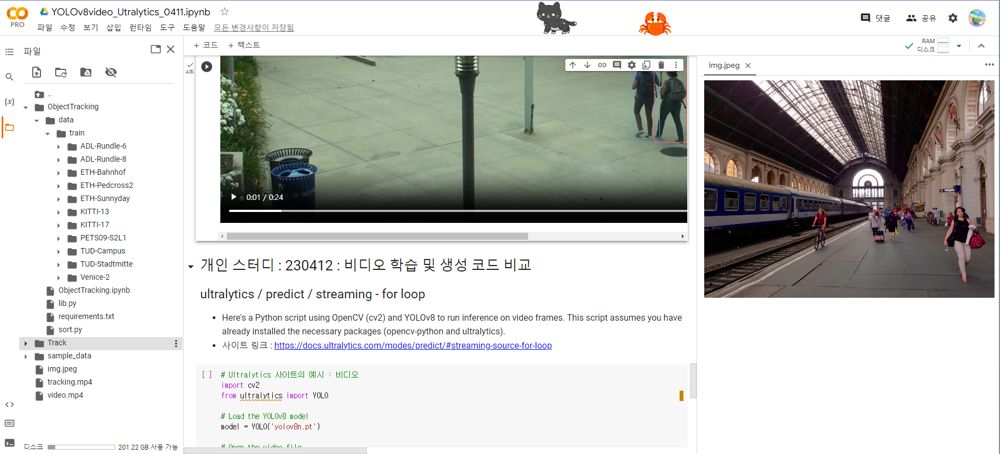